### Imports

In [1]:
import glob
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

### Calculate Camera Matrix and Distortion Coefficents and undistort images

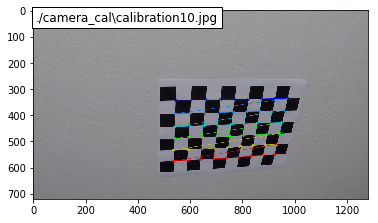

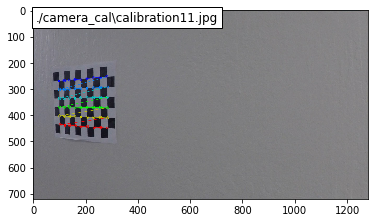

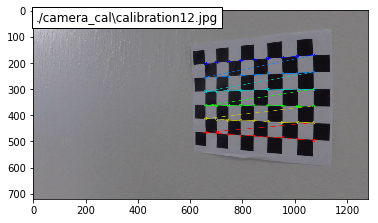

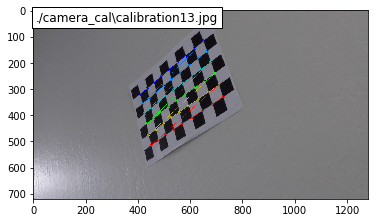

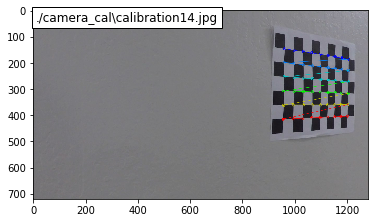

...

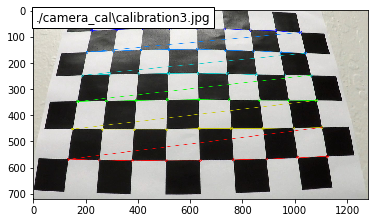

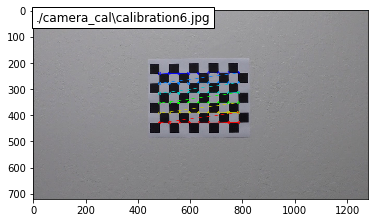

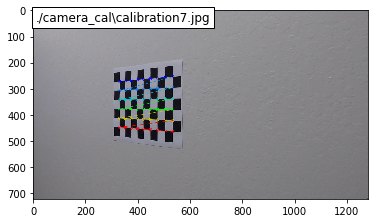

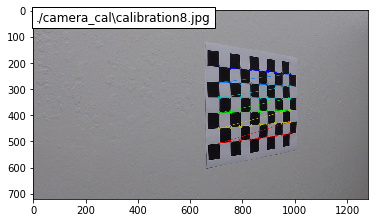

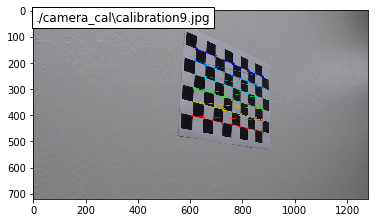

In [2]:
# Make a list of calibration image names
image_names = glob.glob('./camera_cal/calibration*.jpg')
# Arrays to store object points and image points from all the image
objpoints = [] # 3D points in real world space
imgpoints = [] # 2D points in image plane

# prepare object points, like (0,0,0),(1,0,0), ... ,(7,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2) # x,y coordinates
for image_name in image_names:
    # read in each image
    image = mpimg.imread(image_name)
    
    # convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    
    # if corners are found, add object points and image points
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        
        # draw and display the corner
        image = cv2.drawChessboardCorners(image,(9,6),corners,ret)
        plt.figure()
        plt.text(10,40,image_name,{'color':'black','size':12},bbox={'facecolor':'white'})
        plt.imshow(image)

### Use the obtained image points and object points to calibrate the camera and undistort some test images

<Figure size 432x288 with 0 Axes>

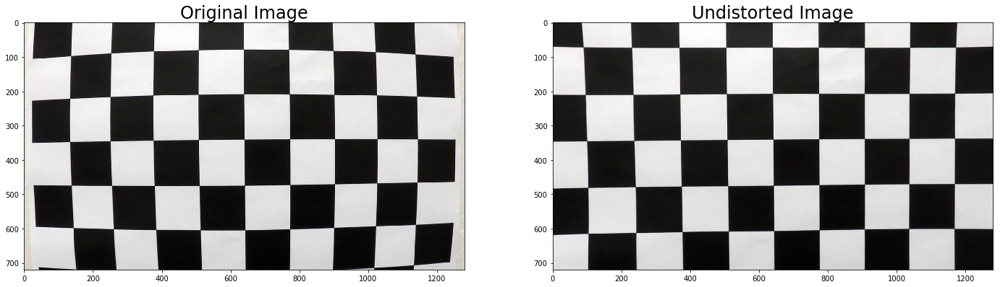

<Figure size 432x288 with 0 Axes>

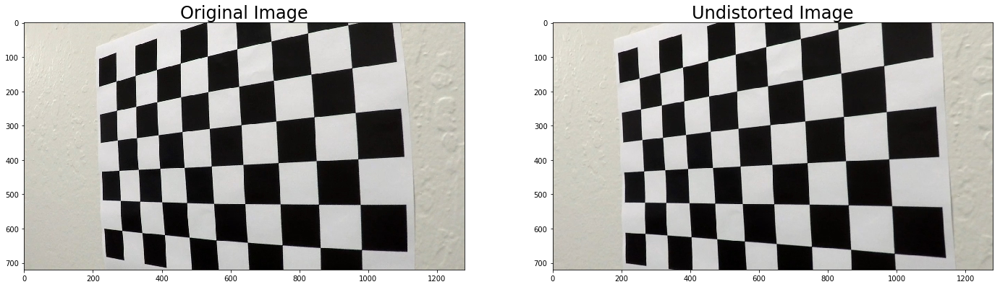

<Figure size 432x288 with 0 Axes>

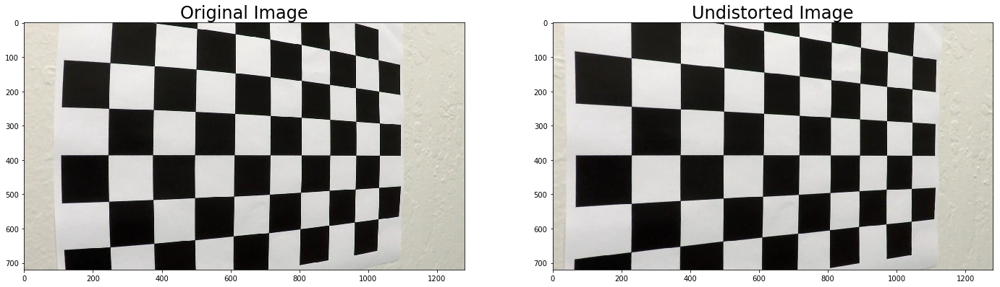

In [3]:
image_names = ['camera_cal/calibration1.jpg','camera_cal/calibration4.jpg','camera_cal/calibration5.jpg']

for image_name in image_names:
    image = mpimg.imread(image_name)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints,imgpoints,image.shape[1::-1],None,None)
    undist = cv2.undistort(image,mtx,dist,None,mtx)
    plt.figure()
    f,(ax1,ax2) = plt.subplots(1,2,figsize = (24,9))
    ax1.set_title('Original Image',fontsize = 24)
    ax1.imshow(image)
    ax2.set_title('Undistorted Image',fontsize = 24)
    ax2.imshow(undist)

### Undistort Some images takenfrom the same camera of the road

<Figure size 432x288 with 0 Axes>

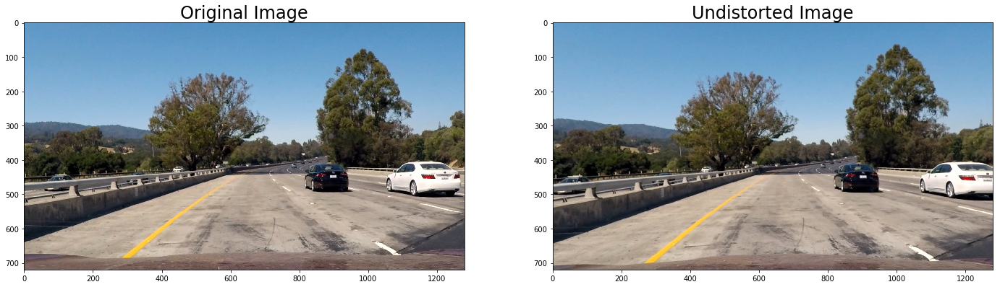

<Figure size 432x288 with 0 Axes>

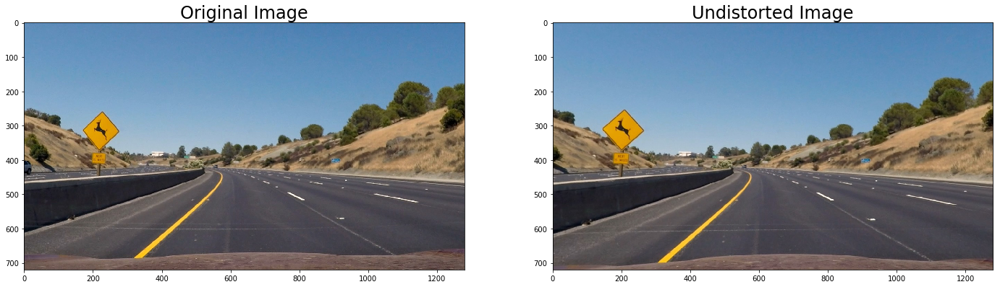

<Figure size 432x288 with 0 Axes>

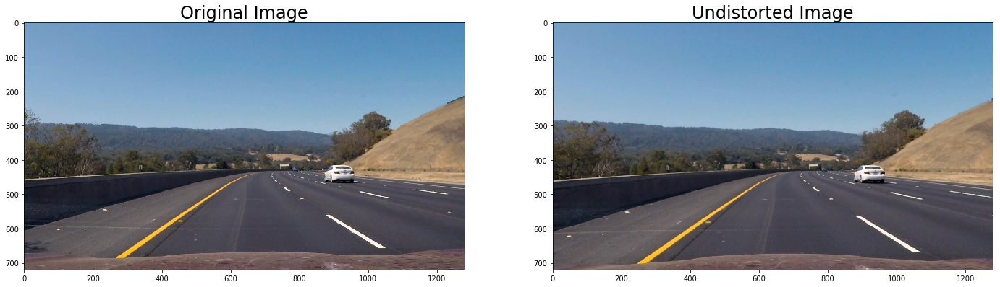

<Figure size 432x288 with 0 Axes>

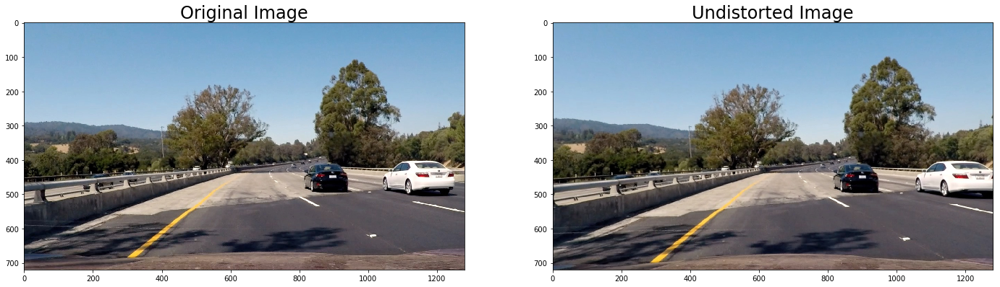

<Figure size 432x288 with 0 Axes>

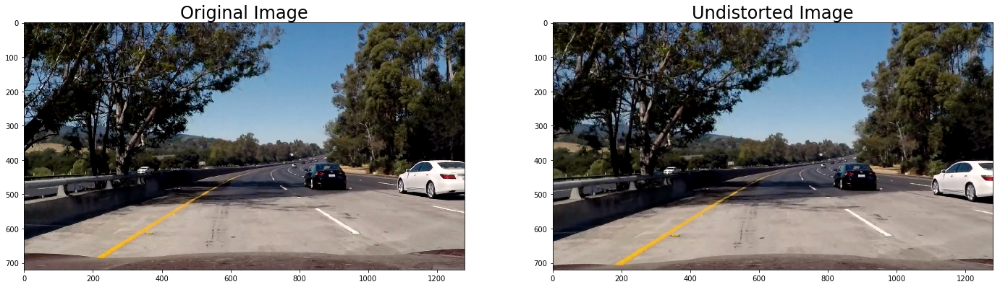

<Figure size 432x288 with 0 Axes>

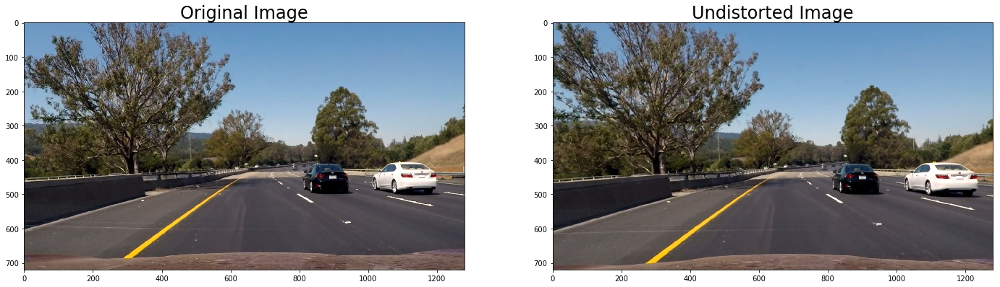

In [4]:
image_names = glob.glob('./test_images/test*.jpg')
undistorted_images = []
for image_name in image_names:
    # Read in the image
    image = mpimg.imread(image_name)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints,imgpoints,image.shape[1::-1],None,None)
    undist = cv2.undistort(image,mtx,dist,None,mtx)
    undistorted_images.append(undist)
    plt.figure()
    f,(ax1,ax2) = plt.subplots(1,2,figsize = (24,9))
    ax1.set_title('Original Image',fontsize = 24)
    ax1.imshow(image)
    ax2.set_title('Undistorted Image',fontsize = 24)
    ax2.imshow(undist)

### Applying Perspective Transform to view the road from bird's eye view

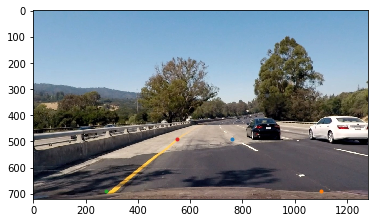

In [5]:
#%matplotlib nbagg

plt.imshow(undistorted_images[3])
plt.plot(760,490,'.')
plt.plot(1100,690,'.')
plt.plot(280,690, '.')
plt.plot(550,490,'.')

In [6]:
%matplotlib inline

# Define perspective transform function
def warp(undistorted_image):
    # define calibration box in source (original) and 
    # destination (destination or warped) coordinates
    image_size = undistorted_image.shape[1::-1]
    # Four source coordinates
    src = np.float32([[760,490],
                     [1100,690],
                     [280,690],
                     [550,490]])
    # Four desired coordinates
    dst = np.float32([[1100,155],
                     [1100,680],
                     [290,680],
                     [300,155]])
    # Compute the perspective transform M
    M = cv2.getPerspectiveTransform(src, dst)
    
    
    # Create the warped image - uses linear interpolation
    warped = cv2.warpPerspective(undistorted_image, M, image_size,flags = cv2.INTER_LINEAR)
    
    return warped 

def unwarp(warped_image):
    # define calibration box in source (original) and 
    # destination (destination or warped) coordinates
    image_size = warped_image.shape[1::-1]
    # Four source coordinates
    src = np.float32([[760,490],
                     [1100,690],
                     [280,690],
                     [550,490]])
    # Four desired coordinates
    dst = np.float32([[1100,155],
                     [1100,680],
                     [290,680],
                     [300,155]])
    # Compute the inverse perspective transform
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # unwarp the warped image - uses linear interpolation
    unwarped = cv2.warpPerspective(warped_image, Minv, image_size,flags = cv2.INTER_LINEAR)
    
    return unwarped

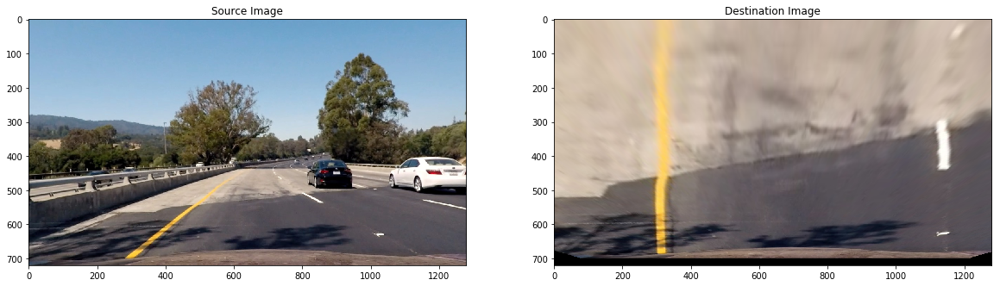

In [7]:
# Get perspective Transform
warped_image = warp(undistorted_images[3])

# Visualize Transform
f,(ax1, ax2) = plt.subplots(1,2,figsize = (20,10))
ax1.set_title('Source Image')
ax1.imshow(undistorted_images[3])

ax2.set_title('Destination Image')
ax2.imshow(warped_image)

### Use color transforms and gradients to create thresholded binary images

In [8]:
# the function to take x and y gradient threshold
def abs_sobel_thresh(image, orient = 'x', thresh = (0,255)):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        sobel = cv2.Sobel(gray,cv2.CV_64F,1,0,)
    elif orient == 'y':
        sobel = cv2.Sobel(gray,cv2.CV_64F,0,1,)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0])&(scaled_sobel <= thresh[1])] = 1
    return binary_output

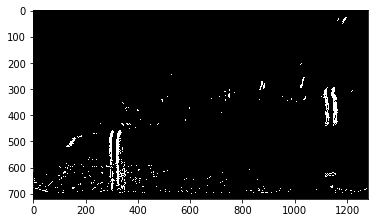

In [9]:
plt.imshow(abs_sobel_thresh(warped_image,'x',(20,100)),cmap='gray')

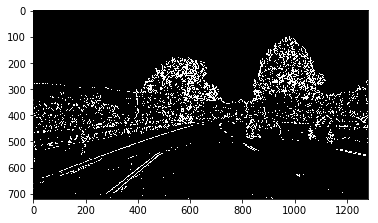

In [10]:
plt.imshow(abs_sobel_thresh(undistorted_images[3],'x',(20,100)),cmap='gray')

#### It seems like gradient thresholding does not work well on sample images so let's experiment with different color spaces and channels


### Experimenting with HLS color space

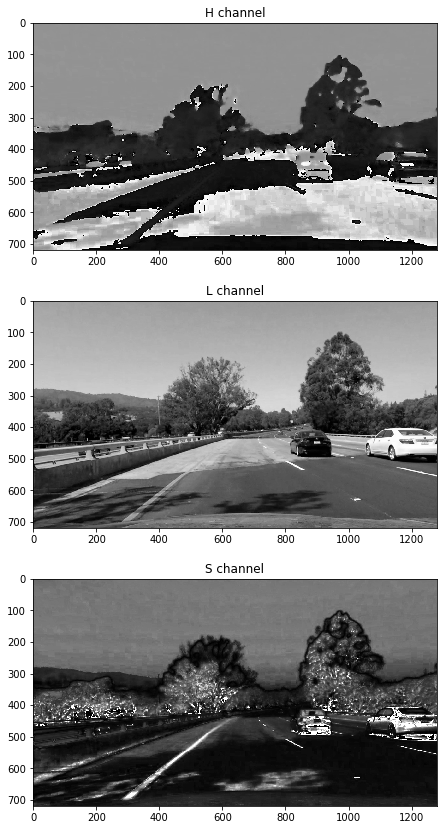

In [11]:
# converting to HLS color space
hls = cv2.cvtColor(undistorted_images[3],cv2.COLOR_RGB2HLS)
h = hls[:,:,0]
l = hls[:,:,1]
s = hls[:,:,2]
f,(ax1,ax2,ax3) = plt.subplots(3,1,figsize = (25,12))
f.tight_layout(pad=3)
ax1.set_title('H channel',fontsize = 12)
ax1.imshow(h, cmap= 'gray')
ax2.set_title('L channel',fontsize = 12)
ax2.imshow(l, cmap= 'gray')
ax3.set_title('S channel',fontsize = 12)
ax3.imshow(s, cmap= 'gray')

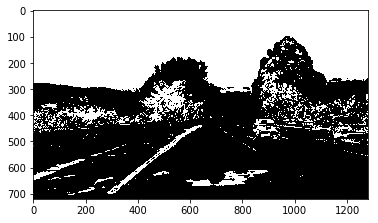

In [12]:
# applying threshold to S color channel
thresh = (85,255)
binary = np.zeros_like(s)
binary[(s>thresh[0])&(s < thresh[1])] = 1
plt.imshow(binary,cmap = 'gray')

#### Thresholding S channel seems promising

### Experimenting with RGB color space

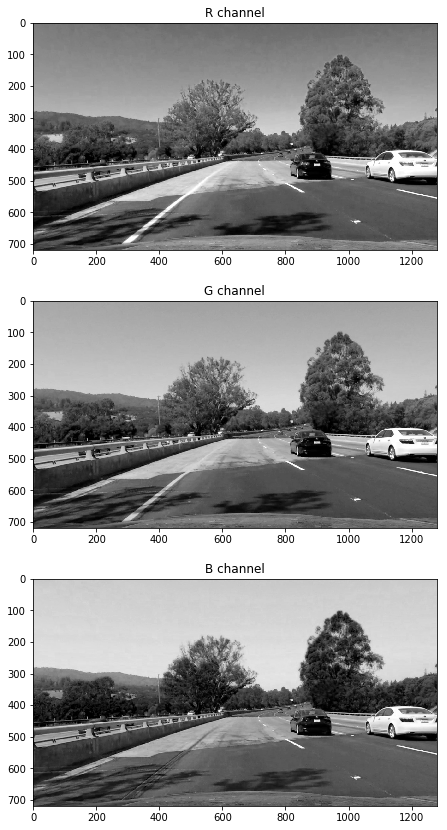

In [13]:
r = np.copy(undistorted_images[3][:,:,0])
g = np.copy(undistorted_images[3][:,:,1])
b = np.copy(undistorted_images[3][:,:,2])

f,(ax1,ax2,ax3) = plt.subplots(3,1,figsize = (25,12))
f.tight_layout(pad=3)
ax1.set_title('R channel',fontsize = 12)
ax1.imshow(r, cmap= 'gray')
ax2.set_title('G channel',fontsize = 12)
ax2.imshow(g, cmap= 'gray')
ax3.set_title('B channel',fontsize = 12)
ax3.imshow(b, cmap= 'gray')

### Applying sobel in x direction to red channel

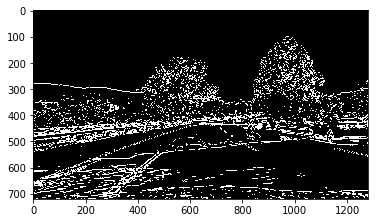

In [14]:
sobel = cv2.Sobel(r,cv2.CV_64F,0,1)
abs_sobel = np.absolute(sobel)
scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
binary_output = np.zeros_like(scaled_sobel)
binary_output[(scaled_sobel >= 20)&(scaled_sobel <= 100)] = 1
plt.imshow(binary_output,cmap='gray')

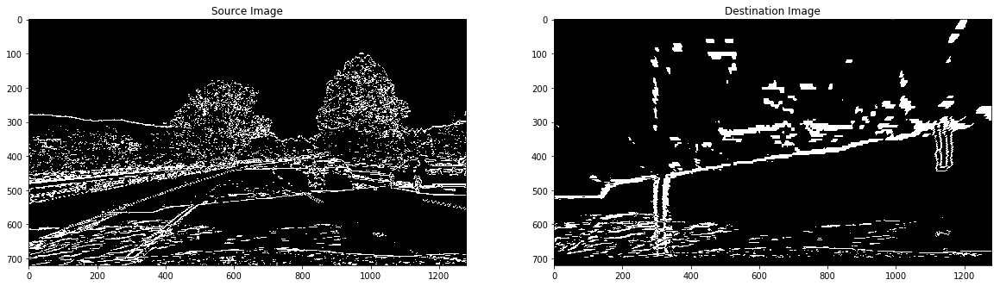

In [15]:
# Get perspective Transform
warped_image = warp(binary_output)

# Visualize Transform
f,(ax1, ax2) = plt.subplots(1,2,figsize = (20,10))
ax1.set_title('Source Image')
ax1.imshow(binary_output,cmap='gray')

ax2.set_title('Destination Image')
ax2.imshow(warped_image,cmap='gray')

### Applying sobel in x direction to the grayscale image

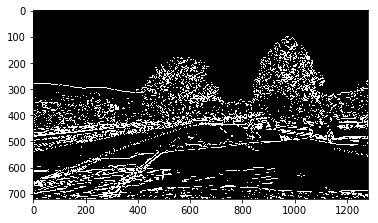

In [16]:
gray = cv2.cvtColor(undistorted_images[3],cv2.COLOR_RGB2GRAY)
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1,0)
abs_sobelx = np.absolute(sobelx)
scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobelx))
#Threshold x gradient
thresh_min = 20
thresh_max = 100
sxbinary = np.zeros_like(scaled_sobel)
sxbinary[(scaled_sobel >= thresh_min)&(scaled_sobel <= thresh_max)] = 1
plt.imshow(sxbinary,cmap='gray')

### Experimenting with magnitude of Sobel (magnitude of gradient)

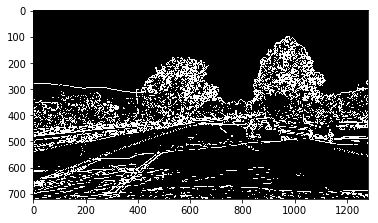

In [17]:
gray = cv2.cvtColor(undistorted_images[3],cv2.COLOR_RGB2GRAY)
sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0)
sobely = cv2.Sobel(gray,cv2.CV_64F,0,1)
abs_sobelxy = np.sqrt(sobelx**2 + sobely**2)
sobelxy_scaled = np.uint8(255 * abs_sobelxy / np.max(abs_sobelxy))
thresh_min = 20
thresh_max = 100
binary_output = np.zeros_like(sobelxy_scaled)
binary_output[(sobelxy_scaled >= thresh_min) & (sobelxy_scaled <= thresh_max)] = 1
plt.imshow(binary_output,cmap = 'gray')

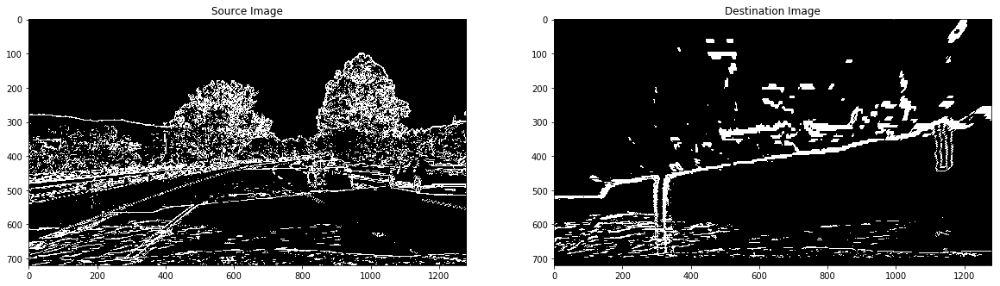

In [18]:
# Get perspective Transform
warped_image = warp(binary_output)

# Visualize Transform
f,(ax1, ax2) = plt.subplots(1,2,figsize = (20,10))
ax1.set_title('Source Image')
ax1.imshow(binary_output,cmap='gray')

ax2.set_title('Destination Image')
ax2.imshow(warped_image,cmap='gray')

### Magnitude of Sobel seems promising in detecting the white lane

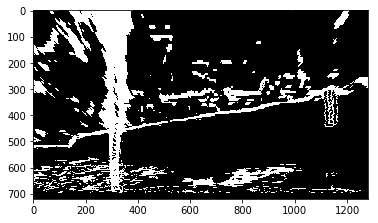

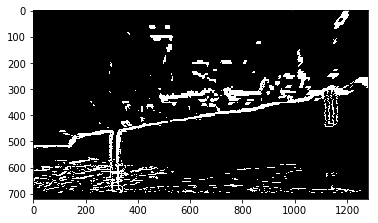

In [19]:
# combining the s channel thresholding and magnitude of sobel thresholding
warped_image = warp(undistorted_images[3])
# lets apply thresholding to S channel
hls_image = cv2.cvtColor(undistorted_images[3],cv2.COLOR_RGB2HLS)
s_channel_image = hls_image[:,:,2]
thresh = (80,255)
s_thresholded_image = np.zeros_like(s_channel_image)
s_thresholded_image[(s_channel_image>thresh[0])&(s_channel_image < thresh[1])] = 1

s_thresholded_image = warp(s_thresholded_image)

#lets apply magnitude of sobel thresholding
gray = cv2.cvtColor(undistorted_images[3],cv2.COLOR_RGB2GRAY)
sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0)
sobely = cv2.Sobel(gray,cv2.CV_64F,0,1)
abs_sobelxy = np.sqrt(sobelx**2 + sobely**2)
sobelxy_scaled = np.uint8(255 * abs_sobelxy / np.max(abs_sobelxy))
thresh_min = 20
thresh_max = 100
sobel_thresholded_image = np.zeros_like(sobelxy_scaled)
sobel_thresholded_image[(sobelxy_scaled >= thresh_min) & (sobelxy_scaled <= thresh_max)] = 1
sobel_thresholded_image = warp(sobel_thresholded_image)

# combine two thresholds
combined_binary = np.zeros_like(sobel_thresholded_image)
combined_binary[(s_thresholded_image == 1)|(sobel_thresholded_image == 1)] = 1

plt.imshow(combined_binary,cmap='gray')
plt.figure()
plt.imshow(sobel_thresholded_image,cmap='gray')

### Let's see what we've got so far by running our pipeline on a video stream

In [20]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

ModuleNotFoundError: No module named 'moviepy'

In [ ]:
# function to undistort images 
def undistort(image, mtx,dist):
    undist = cv2.undistort(image,mtx,dist,None,mtx)
    return undist

In [ ]:
# applying only s thresholding
ret, mtx, dist,rvecs,tvecs = cv2.calibrateCamera(objpoints,imgpoints,image.shape[1::-1],None,None)
def process_image(image):
    # first let's get rid of camera distortion
    undistorted_image = undistort(image,mtx,dist)
    # let's change camera pespective into bird's eye view
    warped_image = warp(undistorted_image)
    
    # lets apply thresholding to S channel
    hls_image = cv2.cvtColor(warped_image,cv2.COLOR_RGB2HLS)
    s_channel_image = hls_image[:,:,2]
    thresh = (85,255)
    thresholded_image = np.zeros_like(s_channel_image)
    thresholded_image[(s_channel_image>thresh[0])&(s_channel_image < thresh[1])] = 1
    # creating a three channel  image from our 1 channel binary(B&W) Image
    three_channel_thresholded_image = np.dstack((thresholded_image,thresholded_image,thresholded_image))*255
    return three_channel_thresholded_image 
    
    

output_file_path = 'project_video_output_s_thresholding.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
input_video = VideoFileClip("project_video.mp4")
output_video = input_video.fl_image(process_image) #NOTE: this function expects color images!!
%time output_video.write_videofile(output_file_path, audio=False)

In [ ]:
HTML("""
<video width="480" height="270" controls>
  <source src="{0}">
</video>
""".format(output_file_path))

In [ ]:
# applying both s thresholding and sobel magnitude thresholding
ret, mtx, dist,rvecs,tvecs = cv2.calibrateCamera(objpoints,imgpoints,image.shape[1::-1],None,None)
def process_image(image):
    # first let's get rid of camera distortion
    undistorted_image = undistort(image,mtx,dist)
    
    
    # lets apply thresholding to S channel
    hls_image = cv2.cvtColor(undistorted_image,cv2.COLOR_RGB2HLS)
    s_channel_image = hls_image[:,:,2]
    thresh = (80,255)
    s_thresholded_image = np.zeros_like(s_channel_image)
    s_thresholded_image[(s_channel_image>thresh[0])&(s_channel_image < thresh[1])] = 1
    
    
    #lets apply magnitude of sobel thresholding
    gray = cv2.cvtColor(undistorted_image,cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0)
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1)
    abs_sobelxy = np.sqrt(sobelx**2 + sobely**2)
    sobelxy_scaled = np.uint8(255 * abs_sobelxy / np.max(abs_sobelxy))
    thresh_min = 20
    thresh_max = 100
    sobel_thresholded_image = np.zeros_like(sobelxy_scaled)
    sobel_thresholded_image[(sobelxy_scaled >= thresh_min) & (sobelxy_scaled <= thresh_max)] = 1


    # combine two thresholds
    combined_binary = np.zeros_like(sobel_thresholded_image)
    combined_binary[(s_thresholded_image == 1)|(sobel_thresholded_image == 1)] = 1
    
    
    # let's change camera pespective into bird's eye view
    warped_image = warp(combined_binary)
    
    # creating a three channel  image from our 1 channel binary(B&W) Image
    three_channel_thresholded_image = np.dstack((warped_image,warped_image,warped_image))*255
    return three_channel_thresholded_image 
    
    

output_file_path = 'project_video_output_s_and_sobel_thresholding.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
input_video = VideoFileClip("project_video.mp4")
output_video = input_video.fl_image(process_image) #NOTE: this function expects color images!!
%time output_video.write_videofile(output_file_path, audio=False)

In [ ]:

HTML("""
<video width="480" height="270" controls>
  <source src="{0}">
</video>
""".format(output_file_path))

### Implementing the sliding window algorithm

In [ ]:
# running sliding window algorithm

# first take a histogram of the image
test_image = mpimg.imread('./test_folder/1.jpg')
plt.imshow(test_image)
# only need values in one channel of image, since all channels holds the same value
histogram = np.sum(test_image[:,:,0],axis = 0) 
plt.figure()
plt.plot(histogram)

In [ ]:
# find the peaks of the left and right halves of the histogram
# as the starting point for the left and right lines

midpoint = np.int(histogram.shape[0]//2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:])+midpoint

In [ ]:
# Hyperparameters
# choose the number of sliding windows
nwindows = 9
# Set the width of the windows +/- margin
margin = 100
# Set the minimum number of the pixels to recenter the windows 
minpix = 50
# Set height of the windows - based on nwindows above and image shape
window_height = test_image.shape[0] // nwindows
out_img = np.copy(test_image)
# Identify the x and y positions of all nonzero (i.e. activated) pixels in the image
nonzero = test_image.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated later for each window in nwindows
leftx_current = leftx_base
rightx_current = rightx_base

# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

for window in range(nwindows):
    #Identify window boundaries in x and y
    win_y_low = test_image.shape[0] - (window+1)*window_height
    win_y_high = test_image.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin  
    win_xright_high = rightx_current + margin
    
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)
    
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists 
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    #if more than minpix pixels were found , recenter next window on their mean position 
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
# Concatenate the arrays of indices (previously was a list of lists of pixels)
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]

# Fit a second order polynomial to each set of lane points
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

# Generate x and y values for plotting
ploty = np.linspace(0, test_image.shape[0]-1, test_image.shape[0])

left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]


# Highlightign the left and right lane regions
out_img[lefty, leftx] = [255, 0, 0]
out_img[righty, rightx] = [0, 0, 255]
# Plotting the left and right polynomials on the lane lines
plt.figure(figsize=(10, 8))
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.imshow(out_img)

### Testing the current pipeline on the an input video

In [ ]:

def draw_sliding_window(image):
    histogram = np.sum(image[:,:,0],axis = 0)
    # find the peaks of the left and right halves of the histogram
    # as the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:])+midpoint
    # Hyperparameters
    # choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set the minimum number of the pixels to recenter the windows 
    minpix = 50
    # Set height of the windows - based on nwindows above and image shape
    window_height = image.shape[0] // nwindows
    
    # Identify the x and y positions of all nonzero (i.e. activated) pixels in the image
    nonzero = image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    for window in range(nwindows):
        #Identify window boundaries in x and y
        win_y_low = image.shape[0] - (window+1)*window_height
        win_y_high = image.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin  
        win_xright_high = rightx_current + margin

        # Draw the windows on the visualization image
        cv2.rectangle(image,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(image,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists 
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        #if more than minpix pixels were found , recenter next window on their mean position 
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]


    # Generate x and y values for plotting
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0])
    try:
        # Fit a second order polynomial to each set of lane points
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
    
    # Highlightign the left and right lane regions
    image[lefty, leftx] = [255, 0, 0]
    image[righty, rightx] = [0, 0, 255]
    
    # drawing the left and right polynomials on the lane lines
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(image, np.int_([pts]), (0,255, 0))
    
    return image

In [ ]:
output_file_path = 'project_video_output2.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("./project_video_output2.mp4").subclip(0,5)
input_video = VideoFileClip("project_video_output_s_and_sobel_thresholding.mp4")
output_video = input_video.fl_image(draw_sliding_window) #NOTE: this function expects color images!!
%time output_video.write_videofile(output_file_path, audio=False)

In [ ]:
HTML("""
<video width="480" height="270" controls>
  <source src="{0}">
</video>
""".format(output_file_path))

In [ ]:
def highlight_lane(image):
    histogram = np.sum(image[:,:,0],axis = 0)
    # find the peaks of the left and right halves of the histogram
    # as the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:])+midpoint
    # Hyperparameters
    # choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set the minimum number of the pixels to recenter the windows 
    minpix = 50
    # Set height of the windows - based on nwindows above and image shape
    window_height = image.shape[0] // nwindows
    
    # Identify the x and y positions of all nonzero (i.e. activated) pixels in the image
    nonzero = image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    for window in range(nwindows):
        #Identify window boundaries in x and y
        win_y_low = image.shape[0] - (window+1)*window_height
        win_y_high = image.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin  
        win_xright_high = rightx_current + margin


        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists 
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        #if more than minpix pixels were found , recenter next window on their mean position 
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]


    # Generate x and y values for plotting
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0])
    try:
        # Fit a second order polynomial to each set of lane points
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
    
    # Highlightign the left and right lane regions 
    # drawing the left and right polynomials on the lane lines
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(image, np.int_([pts]), (0,255, 0))
    
    # change the perspective back into the original view
    unwarped_image = unwarp(image)
    return unwarped_image

In [ ]:
output_file_path = 'project_video_output3.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("project_video_output2.mp4").subclip(0,5)
input_video = VideoFileClip("./project_video_output_s_and_sobel_thresholding.mp4")
output_video = input_video.fl_image(highlight_lane) #NOTE: this function expects color images!!
%time output_video.write_videofile(output_file_path, audio=False)

In [ ]:
HTML("""
<video width="480" height="270" controls>
  <source src="{0}">
</video>
""".format(output_file_path))

In [ ]:
# highlights the lane in the original video stream
def highlight_lane_original(image):
    
    # process the image to undistort, apply s and sobel thresholding 
    # and warp it into the bird's eye view
    processed_image = process_image(image)
    
    histogram = np.sum(processed_image[:,:,0],axis = 0)
    # find the peaks of the left and right halves of the histogram
    # as the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:])+midpoint
    # Hyperparameters
    # choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set the minimum number of the pixels to recenter the windows 
    minpix = 50
    # Set height of the windows - based on nwindows above and image shape
    window_height = processed_image.shape[0] // nwindows
    
    # Identify the x and y positions of all nonzero (i.e. activated) pixels in the image
    nonzero = processed_image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    for window in range(nwindows):
        #Identify window boundaries in x and y
        win_y_low = processed_image.shape[0] - (window+1)*window_height
        win_y_high = processed_image.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin  
        win_xright_high = rightx_current + margin


        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists 
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        #if more than minpix pixels were found , recenter next window on their mean position 
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]


    # Generate x and y values for plotting
    ploty = np.linspace(0, processed_image.shape[0]-1, processed_image.shape[0])
    try:
        # Fit a second order polynomial to each set of lane points
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
    
    # Highlightign the left and right lane regions 
    # drawing the left and right polynomials on the lane lines
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    blank_image = np.zeros_like(processed_image)
    # Draw the lane onto a blank warped image
    cv2.fillPoly(blank_image, np.int_([pts]), (0,255, 0))
    
    # change the perspective back into the original view
    unwarped_image = unwarp(blank_image)
    
    # add the unwarped processed image to the original image
    weighted_image = cv2.addWeighted(image, 1.0, unwarped_image, .7, 0)
    return weighted_image

In [ ]:
output_file_path = 'project_video_output4.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("./project_video_output4.mp4").subclip(0,5)
input_video = VideoFileClip("project_video.mp4")
output_video = input_video.fl_image(highlight_lane_original) #NOTE: this function expects color images!!
%time output_video.write_videofile(output_file_path, audio=False)

In [ ]:
HTML("""
<video width="480" height="270" controls>
  <source src="{0}">
</video>
""".format(output_file_path))

In [ ]:
def measure_curvature(ploty,leftx ,lefty, rightx, righty):
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 3*10/720 # meters per pixel in y dimension
                         # (we're projecting roughly 10 dashed line into 720pixels,
                         # each dashed line is 3 m per standards)
    xm_per_pix = 3.7/800 # meters per pixel in x dimension(3.7 m is the standar us lane width)
    
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    y_eval_left = np.max(ploty)
    y_eval_right = np.max(ploty)

    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval_left*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval_right*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad
    


# highlights the lane in the original video stream

def highlight_lane_original(image):
    
    # process the image to undistort, apply s and sobel thresholding 
    # and warp it into the bird's eye view
    processed_image = process_image(image)
    
    histogram = np.sum(processed_image[:,:,0],axis = 0)
    # find the peaks of the left and right halves of the histogram
    # as the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:])+midpoint
    # Hyperparameters
    # choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set the minimum number of the pixels to recenter the windows 
    minpix = 50
    # Set height of the windows - based on nwindows above and image shape
    window_height = processed_image.shape[0] // nwindows
    
    # Identify the x and y positions of all nonzero (i.e. activated) pixels in the image
    nonzero = processed_image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    for window in range(nwindows):
        #Identify window boundaries in x and y
        win_y_low = processed_image.shape[0] - (window+1)*window_height
        win_y_high = processed_image.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin  
        win_xright_high = rightx_current + margin


        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists 
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        #if more than minpix pixels were found , recenter next window on their mean position 
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]


    # Generate x and y values for plotting
    ploty = np.linspace(0, processed_image.shape[0]-1, processed_image.shape[0])
    try:
        # Fit a second order polynomial to each set of lane points
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
    
    
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    blank_image = np.zeros_like(processed_image)
    # Draw the lane onto a blank warped image
    cv2.fillPoly(blank_image, np.int_([pts]), (0,255, 0))
    
    # change the perspective back into the original view
    unwarped_image = unwarp(blank_image)
    
    # add the unwarped processed image to the original image
    weighted_image = cv2.addWeighted(image, 1.0, unwarped_image, .3, 0)
    
    # calculate the curvature of curve:
    left_curverad, right_curverad = measure_curvature(ploty,leftx ,lefty, rightx, righty)
    
    # write the curvature values on the frame
    font                   = cv2.FONT_HERSHEY_SIMPLEX
    bottomLeftCornerOfText = (100,100)
    fontScale              = 1
    fontColor              = (255,255,255)
    lineType               = 2
    left_curvature_text = 'Left Curvature: '+ '{:04.2f}'.format(left_curverad)+ ' m'
    right_curvature_text = '   Right Curvature: ' +'{:04.2f}'.format(right_curverad)+ ' m'
    curvature_text = left_curvature_text + right_curvature_text
    cv2.putText(weighted_image,
                curvature_text,
                bottomLeftCornerOfText, 
                font, 
                fontScale,
                fontColor,
                lineType)
    
    # calculate offset
    # find x values of leftftix and rightfitx at the bottom of the image (y max) and 
    # find the mid point between left and right lane
    y_eval = np.max(ploty)
    x_left_eval = left_fit[0]*y_eval**2 + left_fit[1]*y_eval + left_fit[2]
    x_right_eval = right_fit[0]*y_eval**2 + right_fit[1]*y_eval + right_fit[2]
    car_location = x_left_eval+(x_right_eval - x_left_eval) / 2
    car_offset = image.shape[1] / 2 - car_location
    xm_per_pix = 3.7/800
    car_offset_meter = car_offset *xm_per_pix
    if car_offset_meter <= 0 :
        direction = 'right of center'
    else:
        direction = 'left of center'
    car_offset_text = 'Car offset: '+ '{:04.3f}'.format(abs(car_offset_meter)) +' m ' +direction
    cv2.putText(weighted_image,
                car_offset_text,
                (100,200), 
                font, 
                fontScale,
                fontColor,
                lineType)
    
    return weighted_image

In [ ]:
output_file_path = 'project_video_output5.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("./project_video_output5.mp4").subclip(0,5)
input_video = VideoFileClip("project_video.mp4")
output_video = input_video.fl_image(highlight_lane_original) #NOTE: this function expects color images!!
%time output_video.write_videofile(output_file_path, audio=False)

In [ ]:
HTML("""
<video width="480" height="270" controls>
  <source src="{0}">
</video>
""".format(output_file_path))